In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import plotly.express as px 
import seaborn as sns
from plotly.offline import iplot , plot 
from plotly.subplots import make_subplots
import warnings
import folium
warnings.filterwarnings("ignore")

In [2]:
train = pd.read_csv(r"F:\Data Anal ;)\ML\Projects\Data\Cognifyz\Dataset.csv")

In [3]:
train

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [5]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Restaurant ID,9551.0,9.051128e+06,8.791521e+06,53.000000,301962.500000,6.004089e+06,1.835229e+07,1.850065e+07
Country Code,9551.0,1.836562e+01,5.675055e+01,1.000000,1.000000,1.000000e+00,1.000000e+00,2.160000e+02
Longitude,9551.0,6.412657e+01,4.146706e+01,-157.948486,77.081343,7.719196e+01,7.728201e+01,1.748321e+02
Latitude,9551.0,2.585438e+01,1.100794e+01,-41.330428,28.478713,2.857047e+01,2.864276e+01,5.597698e+01
Average Cost for two,9551.0,1.199211e+03,1.612118e+04,0.000000,250.000000,4.000000e+02,7.000000e+02,8.000000e+05
Price range,9551.0,1.804837e+00,9.056088e-01,1.000000,1.000000,2.000000e+00,2.000000e+00,4.000000e+00
Aggregate rating,9551.0,2.666370e+00,1.516378e+00,0.000000,2.500000,3.200000e+00,3.700000e+00,4.900000e+00
Votes,9551.0,1.569097e+02,4.301691e+02,0.000000,5.000000,3.100000e+01,1.310000e+02,1.093400e+04


# Level 1
## Task 1

### Identifying the number of rows and columns

In [6]:
print(f"Number of Row : {train.shape[0]}\nNumber of Columns : {train.shape[1]}")

Number of Row : 9551
Number of Columns : 21


### Checking for missing values

In [7]:
train.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

### Analyzing the distribution of the target variable("Aggregate rating")

In [8]:
train['Aggregate rating'].value_counts(ascending=True)

Aggregate rating
1.8       1
1.9       2
2.0       7
2.1      15
4.8      25
2.2      27
4.7      42
2.3      47
4.9      61
4.6      78
2.4      87
4.5      95
2.5     110
4.4     144
4.3     174
2.6     191
4.2     221
2.7     250
4.0     266
4.1     274
2.8     315
3.9     335
2.9     381
3.8     400
3.7     427
3.6     458
3.0     468
3.5     480
3.3     483
3.4     498
3.1     519
3.2     522
0.0    2148
Name: count, dtype: int64

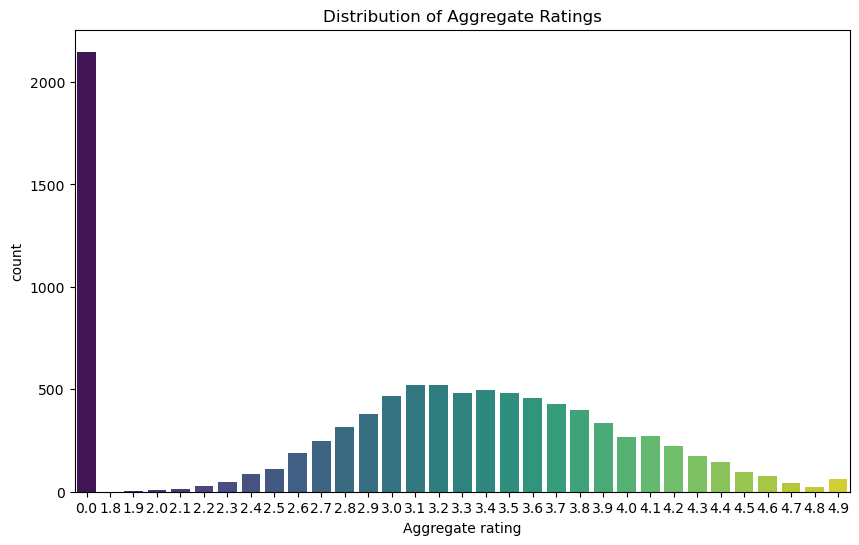

In [9]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=train, palette='viridis')
plt.title('Distribution of Aggregate Ratings')
plt.show()

In [10]:
# Distributions in percentage
agg_per = train['Aggregate rating'].value_counts(ascending=True)/train['Aggregate rating'].value_counts(ascending=True).sum() * 100
agg_per

Aggregate rating
1.8     0.010470
1.9     0.020940
2.0     0.073291
2.1     0.157052
4.8     0.261753
2.2     0.282693
4.7     0.439745
2.3     0.492095
4.9     0.638677
4.6     0.816668
2.4     0.910899
4.5     0.994660
2.5     1.151712
4.4     1.507696
4.3     1.821799
2.6     1.999791
4.2     2.313894
2.7     2.617527
4.0     2.785049
4.1     2.868810
2.8     3.298084
3.9     3.507486
2.9     3.989111
3.8     4.188043
3.7     4.470736
3.6     4.795309
3.0     4.900010
3.5     5.025652
3.3     5.057062
3.4     5.214114
3.1     5.433986
3.2     5.465396
0.0    22.489792
Name: count, dtype: float64

## Aggregate rating is Imbalanced

# Level 1
## Task 2

In [11]:
## All mean, median and std of numerical columns are been displayed below
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Restaurant ID,9551.0,9.051128e+06,8.791521e+06,53.000000,301962.500000,6.004089e+06,1.835229e+07,1.850065e+07
Country Code,9551.0,1.836562e+01,5.675055e+01,1.000000,1.000000,1.000000e+00,1.000000e+00,2.160000e+02
Longitude,9551.0,6.412657e+01,4.146706e+01,-157.948486,77.081343,7.719196e+01,7.728201e+01,1.748321e+02
Latitude,9551.0,2.585438e+01,1.100794e+01,-41.330428,28.478713,2.857047e+01,2.864276e+01,5.597698e+01
Average Cost for two,9551.0,1.199211e+03,1.612118e+04,0.000000,250.000000,4.000000e+02,7.000000e+02,8.000000e+05
Price range,9551.0,1.804837e+00,9.056088e-01,1.000000,1.000000,2.000000e+00,2.000000e+00,4.000000e+00
Aggregate rating,9551.0,2.666370e+00,1.516378e+00,0.000000,2.500000,3.200000e+00,3.700000e+00,4.900000e+00
Votes,9551.0,1.569097e+02,4.301691e+02,0.000000,5.000000,3.100000e+01,1.310000e+02,1.093400e+04


In [12]:
category_columns = train.select_dtypes(include=['object'])

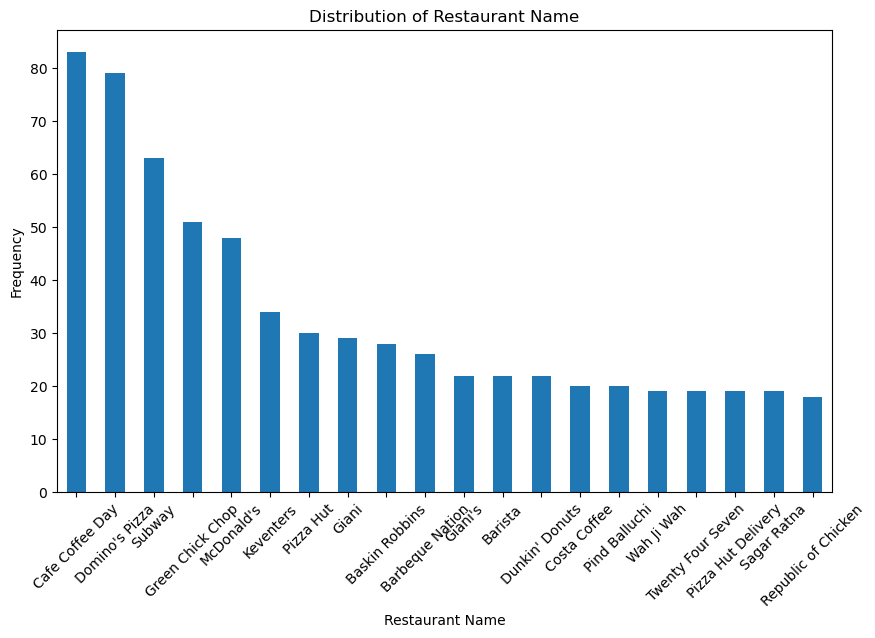

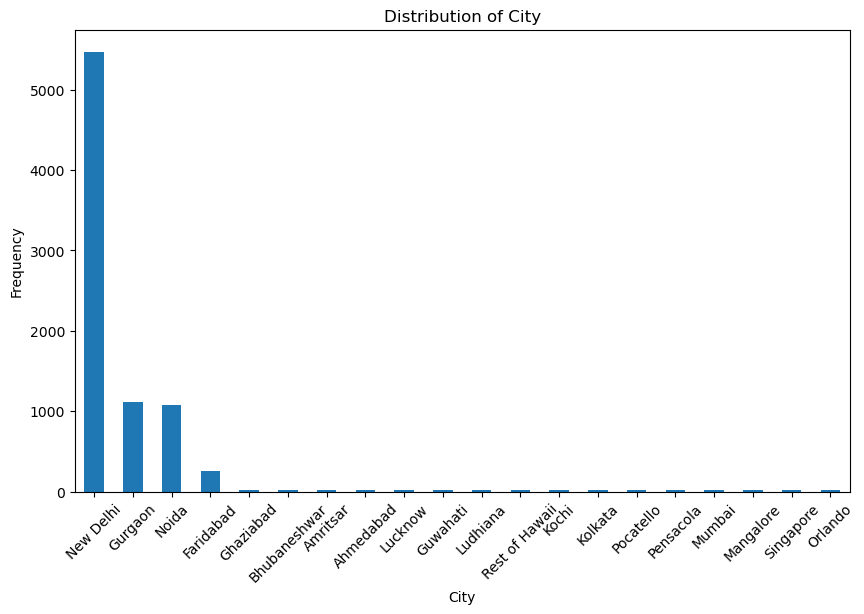

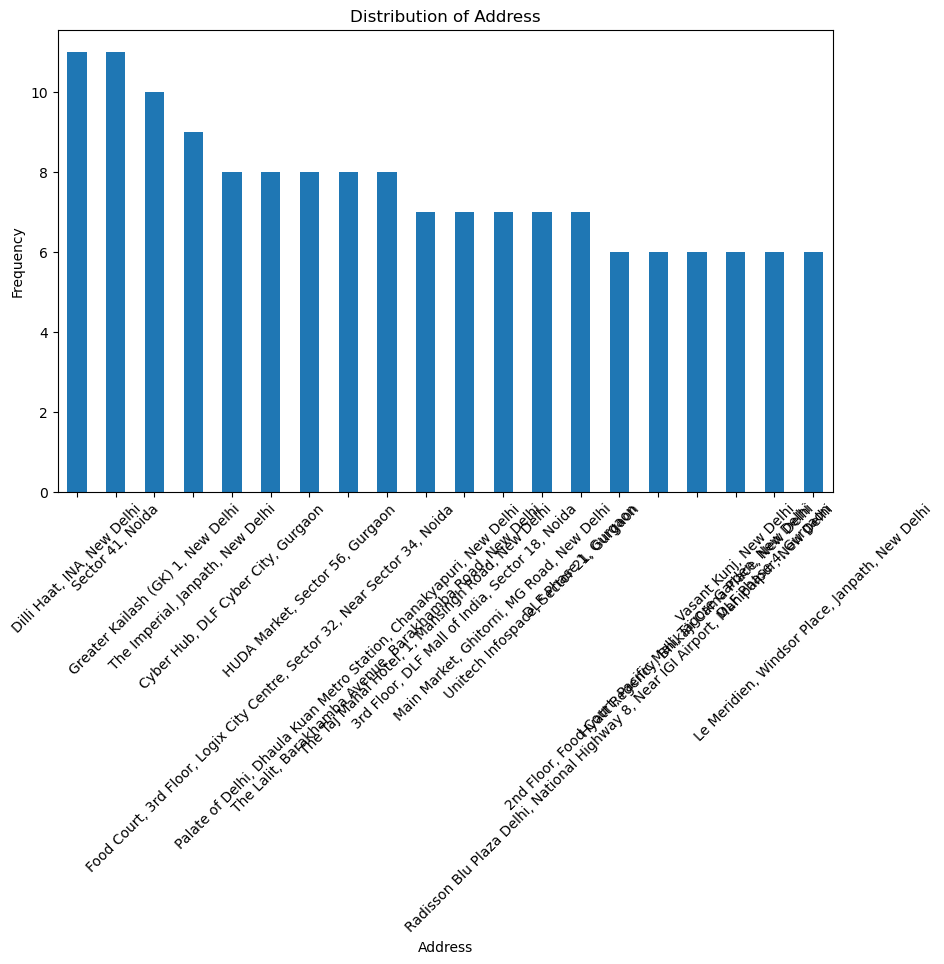

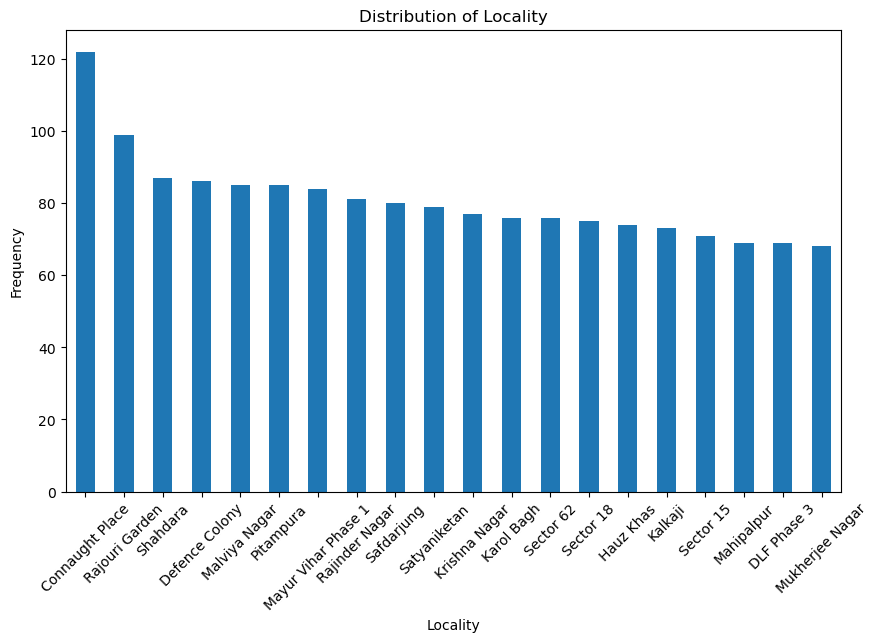

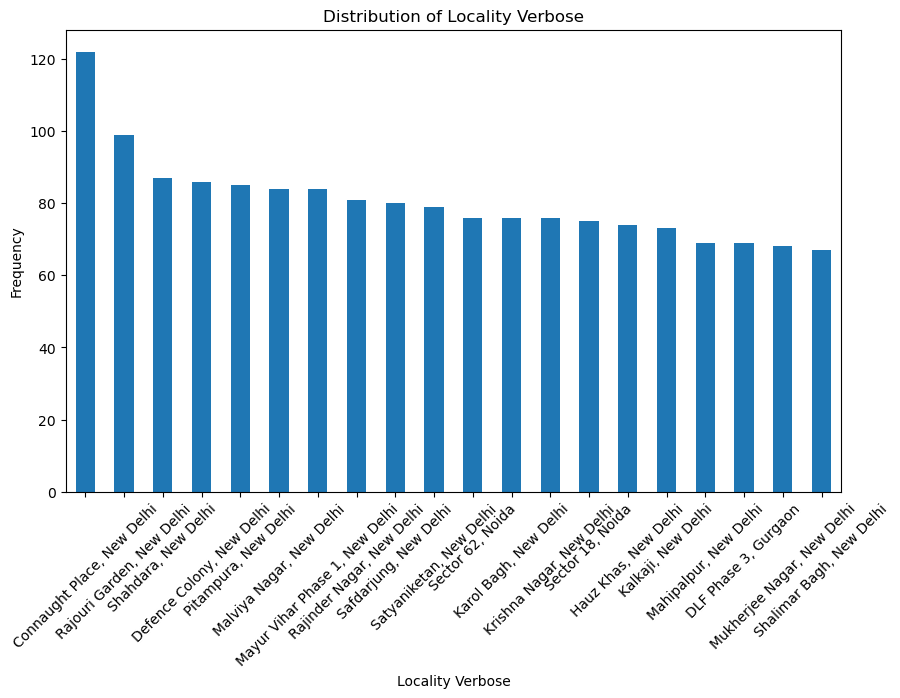

...

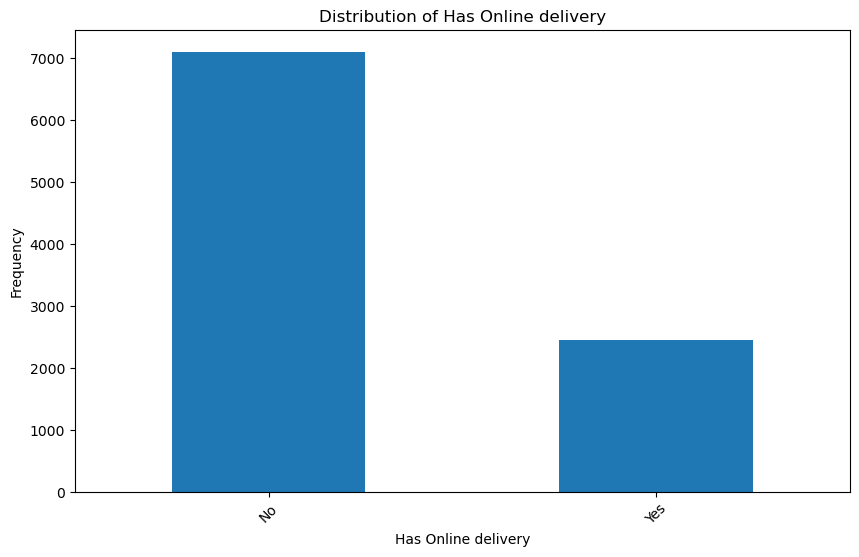

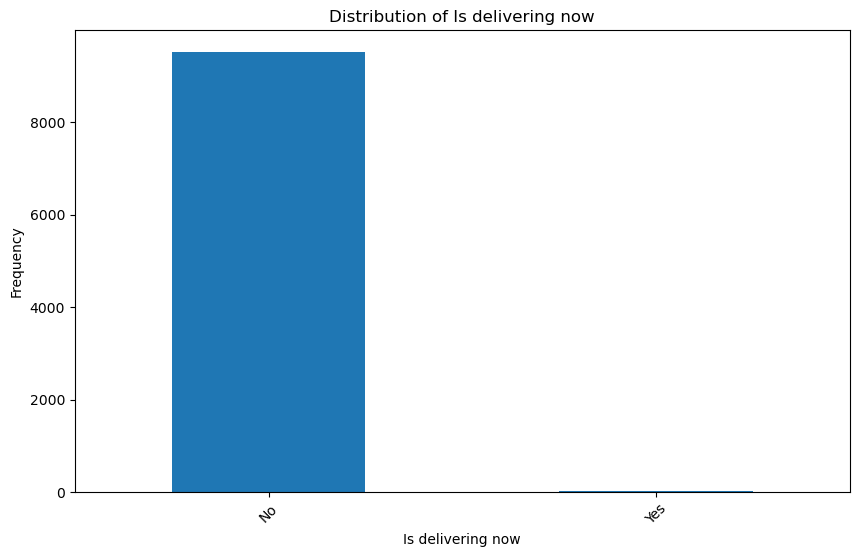

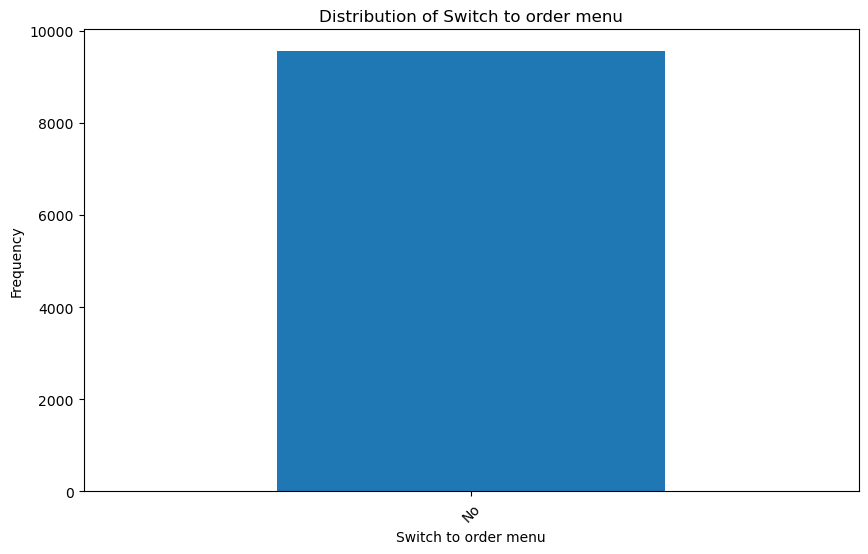

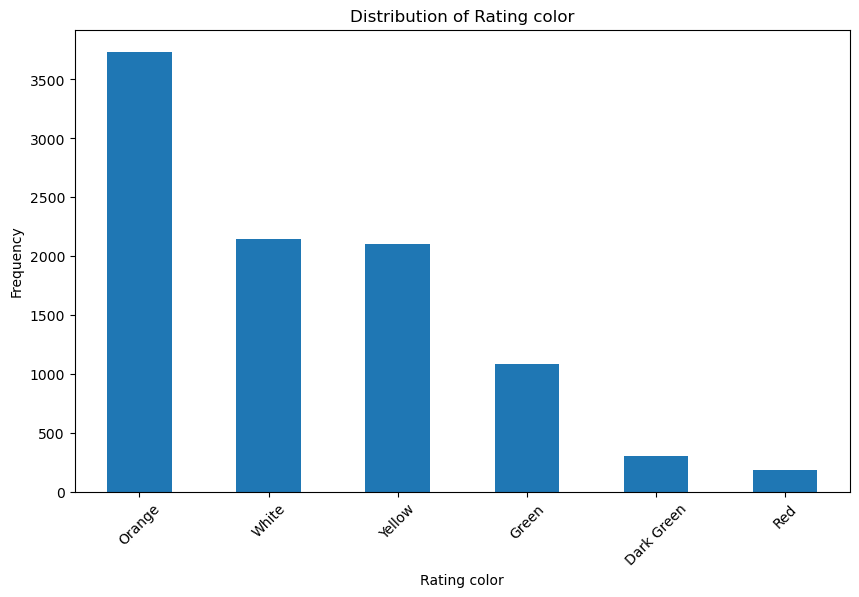

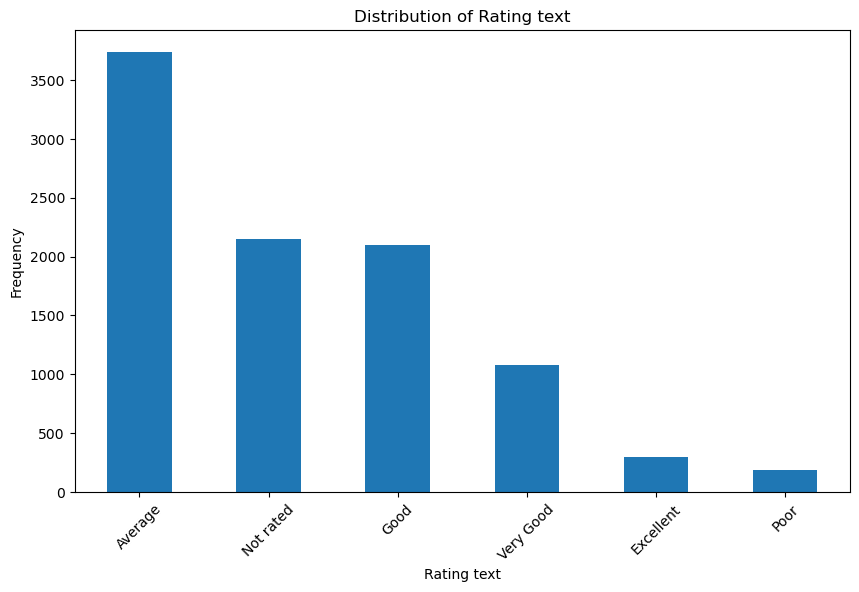

In [13]:
def plot_categorical_distribution(category_columns):
    plt.figure(figsize=(10, 6))
    train[category_columns].value_counts().head(20).plot(kind='bar')
    plt.title(f'Distribution of {category_columns}')
    plt.xlabel(category_columns)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

# Plot the distribution for each categorical column
for col in category_columns:
    plot_categorical_distribution(col)

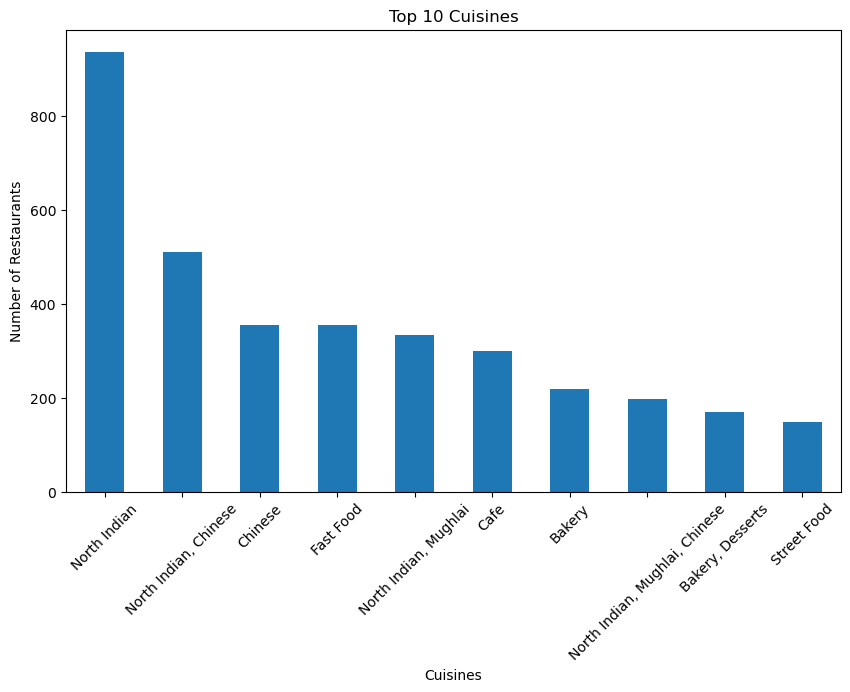

Top Cuisines:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


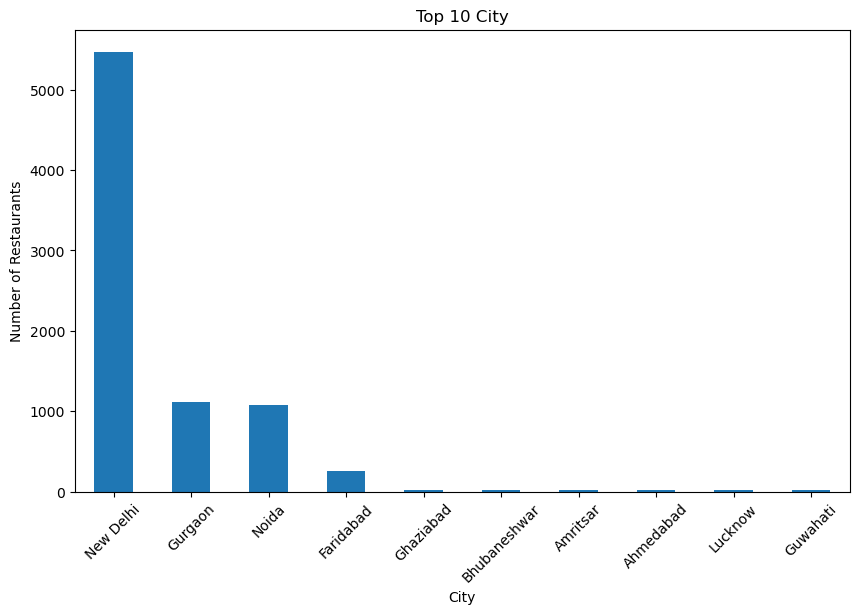

Top Cities:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [14]:
# The top cuisines and cities with the highest number of restaurants

def plot_top_categories(column_name, top_n=10):
    top_categories = train[column_name].value_counts().head(top_n)
    plt.figure(figsize=(10, 6))
    top_categories.plot(kind='bar')
    plt.title(f'Top {top_n} {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Number of Restaurants')
    plt.xticks(rotation=45)
    plt.show()
    return top_categories

top_cuisines = plot_top_categories('Cuisines', top_n=10)
print("Top Cuisines:\n", top_cuisines)

top_cities = plot_top_categories('City', top_n=10)
print("Top Cities:\n", top_cities)

# Level 1
## Task 3

In [15]:
#  Visualizing the locations of restaurants on a map using latitude and longitude information.
fig = px.scatter_mapbox(train, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Restaurant Name", 
                        hover_data=["City", "Cuisines"],
                        color="City", 
                        zoom=3,  
                        height=600)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Restaurant Locations")
fig.show()

In [16]:
# Checking if there is any correlation between the restaurant's location and its rating
city_avg_rating = train.groupby('City')['Aggregate rating'].mean().reset_index()
city_avg_rating.columns = ['City', 'Average Rating']

country_avg_rating = train.groupby('Country Code')['Aggregate rating'].mean().reset_index()
country_avg_rating.columns = ['Country Code', 'Average Rating']


In [17]:
# Correlation by City
fig_city_corr = px.scatter(city_avg_rating, 
                           x='City', 
                           y='Average Rating', 
                           title='Correlation between City and Average Restaurant Rating',
                           labels={'Average Rating':'Average Rating', 'City':'City'},
                           color='Average Rating',
                           color_continuous_scale='Viridis')

fig_city_corr.update_layout(xaxis_tickangle=-45)
fig_city_corr.show()


In [18]:
# Correlation by Country code
fig_country_corr = px.scatter(country_avg_rating, 
                              x='Country Code', 
                              y='Average Rating', 
                              title='Correlation between Country and Average Restaurant Rating',
                              labels={'Average Rating':'Average Rating', 'Country Code':'Country Code'},
                              color='Average Rating',
                              color_continuous_scale='Cividis')

fig_country_corr.update_layout(xaxis_tickangle=-45)
fig_country_corr.show()


# Level 2
## Task 1 : Table Booking and Online Delivery

In [19]:
# Determining the percentage of restaurants that offer table booking and online delivery.
table_booking_percent = train['Has Table booking'].value_counts(normalize=True) * 100
online_delivery_percent = train['Has Online delivery'].value_counts(normalize=True) * 100

In [20]:
iplot(px.pie(values=table_booking_percent.values,
             names=['No','Yes'],
             title='Percentage of Restaurants Offering Table Booking'
).update_traces(textinfo='percent+label'))

In [21]:
iplot(px.pie(values=online_delivery_percent.values,
             names=['No','Yes'],
             title='Percentage of Restaurants Offering Online Delivery'
).update_traces(textinfo='percent+label'))

In [22]:
# Comparing the average ratings of restaurants with table booking and those without.
avg_ratings = train.groupby('Has Table booking')['Aggregate rating'].mean().reset_index()
avg_ratings.columns = ['Has Table Booking', 'Average Rating']
fig = px.bar(avg_ratings, 
             x='Has Table Booking', 
             y='Average Rating', 
             title='Average Ratings of Restaurants With and Without Table Booking',
             labels={'Has Table Booking': 'Has Table Booking', 'Average Rating': 'Average Rating'},
             text_auto=True)
fig.show()

In [23]:
# Analyzing the availability of online delivery among restaurants with different price ranges.
online_delivery_by_price = train.groupby(['Price range', 'Has Online delivery']).size().reset_index(name='Count')
online_delivery_by_price.columns = ['Price Range', 'Has Online Delivery', 'Number of Restaurants']
fig = px.bar(online_delivery_by_price, 
             x='Price Range', 
             y='Number of Restaurants', 
             color='Has Online Delivery', 
             title='Availability of Online Delivery Among Different Price Ranges',
             labels={'Price Range': 'Price Range', 'Number of Restaurants': 'Number of Restaurants'},
             text_auto=True,
             barmode='group')
fig.show()

# Level 2 
## Task 2: Price Range Analysis

In [24]:
# Determining the most common price range among all the restaurants.
price_range_counts = train['Price range'].value_counts()
most_common_price_range = price_range_counts.idxmax()
most_common_count = price_range_counts.max()
print(f"The most common price range is: {most_common_price_range} with {most_common_count} restaurants.")

The most common price range is: 1 with 4444 restaurants.


In [25]:
# Calculating the average rating for each price range.
average_rating_per_price_range = train.groupby('Price range')['Aggregate rating'].mean().reset_index()
print(average_rating_per_price_range)

   Price range  Aggregate rating
0            1          1.999887
1            2          2.941054
2            3          3.683381
3            4          3.817918


In [26]:
fig = px.bar(
    average_rating_per_price_range,
    x='Price range',
    y='Aggregate rating',
    labels={'Price range': 'Price Range', 'Aggregate rating': 'Average Rating'},
    title='Average Rating for Each Price Range'
)
fig.show()

In [27]:
# Identifying the color that represents the highest average rating among different price ranges
avg_rating_color = train.groupby(['Price range', 'Rating color'])['Aggregate rating'].mean().reset_index()
highest_avg_rating_color = avg_rating_color.loc[avg_rating_color.groupby('Price range')['Aggregate rating'].idxmax()]
print(highest_avg_rating_color)

    Price range Rating color  Aggregate rating
0             1   Dark Green          4.668750
6             2   Dark Green          4.627536
12            3   Dark Green          4.646032
18            4   Dark Green          4.709459


# Level 2
## Task: Feature Engineering

### Using LabelEncoding for objects columns

In [28]:
ob = train.select_dtypes(include='object')
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in ob.columns:
    ob[i] = le.fit_transform(ob[i])

In [29]:
train.drop(columns=['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose',
       'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text'],inplace=True)

In [30]:
train = pd.concat([train,ob], axis=1)

# Level 3
## Task: Predictive Modeling

In [31]:
x = train.drop(columns='Aggregate rating')
y = train['Aggregate rating']

<Axes: xlabel='Aggregate rating', ylabel='Density'>

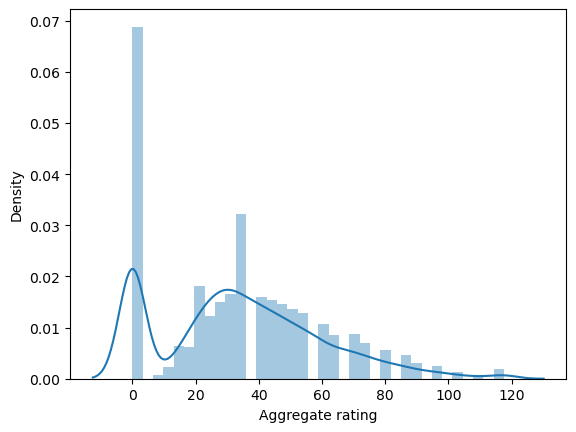

In [32]:
sns.distplot(np.power(y,3))

## Using Linear Regression

In [33]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.3,random_state=42)

In [34]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(x_train,y_train)

LinearRegression()

In [35]:
prediction = model.predict(x_test)

In [36]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

print("R-squared:", r2_score(y_test, prediction))
print("MAE:", mean_absolute_error(y_test, prediction))
print("MSE:", mean_squared_error(y_test, prediction))
print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
print("Mean Absolute Percentage Error (MAPE):",mean_absolute_percentage_error(y_test, prediction) * 100)


R-squared: 0.4669595288133711
MAE: 0.9164341121063663
MSE: 1.2061553948148043
RMSE: 1.0982510618318584
Mean Absolute Percentage Error (MAPE): 1.2736401942749832e+17


## Checking Diffrent Models 

In [37]:
# Ada Boost
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
import xgboost as xg

x = train.drop(columns='Aggregate rating')
y = train['Aggregate rating']

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.3,random_state=42)

model = AdaBoostRegressor()
model.fit(x_train,y_train)
prediction = model.predict(x_test)

In [38]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

print("R-squared:", r2_score(y_test, prediction))
print("MAE:", mean_absolute_error(y_test, prediction))
print("MSE:", mean_squared_error(y_test, prediction))
print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
print("Mean Absolute Percentage Error (MAPE):",mean_absolute_percentage_error(y_test, prediction) * 100)


R-squared: 0.983328005931516
MAE: 0.13823727693677484
MSE: 0.03772511971418722
RMSE: 0.1942295541728581
Mean Absolute Percentage Error (MAPE): 4.346890125464023


In [39]:
# Gradient Boosting
model = GradientBoostingRegressor()
model.fit(x_train,y_train)
prediction = model.predict(x_test)

In [40]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

print("R-squared:", r2_score(y_test, prediction))
print("MAE:", mean_absolute_error(y_test, prediction))
print("MSE:", mean_squared_error(y_test, prediction))
print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
print("Mean Absolute Percentage Error (MAPE):",mean_absolute_percentage_error(y_test, prediction) * 100)


R-squared: 0.9881549373520631
MAE: 0.11538499204270214
MSE: 0.0268028170223613
RMSE: 0.16371565906278268
Mean Absolute Percentage Error (MAPE): 666027554551025.8


## Using Random Forest as its giving best fit model

In [65]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

x = train.drop(columns='Aggregate rating')
y = train['Aggregate rating']

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.3,random_state=42)

model = RandomForestRegressor()
model.fit(x_train,y_train)
prediction = model.predict(x_test)

In [42]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

print("R-squared:", r2_score(y_test, prediction))
print("MAE:", mean_absolute_error(y_test, prediction))
print("MSE:", mean_squared_error(y_test, prediction))
print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
print("Mean Absolute Percentage Error (MAPE):",mean_absolute_percentage_error(y_test, prediction) * 100)


R-squared: 0.9878436080925089
MAE: 0.11340369853454291
MSE: 0.027507287857641307
RMSE: 0.16585321177969786
Mean Absolute Percentage Error (MAPE): 3.5014590507066496


In [43]:
# Feature Importance
importances = model.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
for idx in sorted_indices:
    print(f"{x.columns[idx]}: {importances[idx]}")

Votes: 0.8992605021280494
Rating color: 0.08116499248758496
Rating text: 0.007966341455674803
Restaurant ID: 0.0022701018069624527
Longitude: 0.0014468558940814583
Restaurant Name: 0.0012971360141261008
Address: 0.0012839178001172367
Cuisines: 0.0012354776737826447
Latitude: 0.0011867405779261188
Average Cost for two: 0.0009498910923242683
Locality Verbose: 0.0006040194514943578
Locality: 0.0005843494067120065
Has Online delivery: 0.0003002428064251609
City: 0.00019193013319324898
Price range: 0.00013113196138583955
Has Table booking: 6.258297023764705e-05
Is delivering now: 2.4763183929392706e-05
Currency: 2.4388207113033542e-05
Country Code: 1.4634948879853835e-05
Switch to order menu: 0.0


In [44]:
#plot
importances = model.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
sorted_features = [x.columns[i] for i in sorted_indices]
sorted_importances = importances[sorted_indices]

df_importances = pd.DataFrame({
    'Feature': sorted_features,
    'Importance': sorted_importances
})

fig = px.bar(df_importances, x='Importance', y='Feature', orientation='h', title='Feature Importance')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

### Looking at the above plot we can say that most of the columns have no use or feature importance in them so we can drop them all 

In [46]:
# Calculating VIF for each feature
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

x_with_constant = add_constant(x)  
vif_data = pd.DataFrame()
vif_data['Feature'] = x.columns
vif_data['VIF'] = [variance_inflation_factor(x_with_constant.values, i+1) for i in range(len(x.columns))]
print(vif_data)


                 Feature         VIF
0          Restaurant ID    1.224523
1           Country Code    2.630863
2              Longitude    2.602540
3               Latitude    1.159754
4   Average Cost for two    1.034892
5            Price range    1.760380
6                  Votes    1.232592
7        Restaurant Name    1.008483
8                   City    1.077722
9                Address    1.106159
10              Locality  955.524898
11      Locality Verbose  954.650678
12              Cuisines    1.036726
13              Currency    1.299479
14     Has Table booking    1.461849
15   Has Online delivery    1.092980
16     Is delivering now    1.014529
17  Switch to order menu         NaN
18          Rating color    1.164497
19           Rating text    1.279961


In [47]:
df_importances

,Feature,Importance
0,Votes,0.899261
1,Rating color,0.081165
2,Rating text,0.007966
3,Restaurant ID,0.002270
4,Longitude,0.001447
5,Restaurant Name,0.001297
6,Address,0.001284
7,Cuisines,0.001235
8,Latitude,0.001187
9,Average Cost for two,0.000950


### Droping the columns with least scores 

In [48]:
x_drop = x.drop(columns=['City','Is delivering now', 'Switch to order menu','Country Code','Currency','Price range','Locality Verbose'])

In [49]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Assuming X is your DataFrame with features
x_with_constant = add_constant(x_drop)  # Add a constant column for intercept

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = x_drop.columns
vif_data['VIF'] = [variance_inflation_factor(x_with_constant.values, i+1) for i in range(len(x_drop.columns))]

# Display VIF
print(vif_data)


                 Feature       VIF
0          Restaurant ID  1.196676
1              Longitude  1.197135
2               Latitude  1.051270
3   Average Cost for two  1.023715
4                  Votes  1.192257
5        Restaurant Name  1.005980
6                Address  1.080519
7               Locality  1.049926
8               Cuisines  1.028760
9      Has Table booking  1.064305
10   Has Online delivery  1.069600
11          Rating color  1.097180
12           Rating text  1.226478


## Traing the model with droped columns 

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

x_train, x_test, y_train, y_test = train_test_split(x_drop,y,test_size=.3,random_state=42)

model =RandomForestRegressor()
model.fit(x_train,y_train)
prediction = model.predict(x_test)

In [51]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

print("R-squared:", r2_score(y_test, prediction))
print("MAE:", mean_absolute_error(y_test, prediction))
print("MSE:", mean_squared_error(y_test, prediction))
print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
print("Mean Absolute Percentage Error (MAPE):",mean_absolute_percentage_error(y_test, prediction) * 100)


R-squared: 0.9877579786202653
MAE: 0.11358827634333561
MSE: 0.027701048848569408
RMSE: 0.1664363207012502
Mean Absolute Percentage Error (MAPE): 3.5074452938858593


In [52]:
# Feature Importance of x_drop 
importances = model.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
for idx in sorted_indices:
    print(f"{x_drop.columns[idx]}: {importances[idx]}")

Votes: 0.8996347167928548
Rating color: 0.07915544284541577
Rating text: 0.009726309444816613
Restaurant ID: 0.0023098959960428113
Longitude: 0.0014376651647910522
Restaurant Name: 0.0013445461882697718
Cuisines: 0.0012876245886274458
Address: 0.0012607373986253027
Latitude: 0.0012355312301429247
Locality: 0.00115807141488984
Average Cost for two: 0.0010770748059592264
Has Online delivery: 0.000304459700729088
Has Table booking: 6.792442883533451e-05


In [53]:
#plot
importances = model.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
sorted_features = [x_drop.columns[i] for i in sorted_indices]
sorted_importances = importances[sorted_indices]

df_importances = pd.DataFrame({
    'Feature': sorted_features,
    'Importance': sorted_importances
})

fig = px.bar(df_importances, x='Importance', y='Feature', orientation='h', title='Feature Importance')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [54]:
# Cross Validation score 
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, x_drop, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validated MSE:", -scores.mean())


Cross-validated MSE: 0.02844827167826936


## We have our 22% of data at 0 ratings 

# Level 3
## Task 2 - Customer Preference Analysis

In [55]:
# Analyzing the relationship between the type of cuisine and the restaurant's rating
cuisine_rating = train.groupby('Cuisines')['Aggregate rating'].mean().reset_index()
cuisine_rating = cuisine_rating.sort_values(by='Aggregate rating', ascending=False)
print(cuisine_rating.head(10))

      Cuisines  Aggregate rating
683        683               4.9
169        169               4.9
1062      1062               4.9
37          37               4.9
302        302               4.9
33          33               4.9
1034      1034               4.9
796        796               4.9
803        803               4.9
41          41               4.9


In [56]:
# Plot
fig = px.bar(cuisine_rating, x='Cuisines', y='Aggregate rating',
             title="Average Rating by Cuisine",
             labels={'Aggregate rating': 'Average Rating', 'Cuisines': 'Cuisine'},
             color='Aggregate rating',
             color_continuous_scale=px.colors.sequential.Plasma)


fig.show()

In [57]:
# Identifying the most popular cuisines among customers based on the number of votes
cuisine_votes = x_drop.groupby('Cuisines')['Votes'].sum().reset_index()
cuisine_votes = cuisine_votes.sort_values(by='Votes', ascending=False)
print(cuisine_votes.head(10))

      Cuisines  Votes
1514      1514  53747
1306      1306  46241
1329      1329  42012
331        331  30657
497        497  21925
1520      1520  20115
828        828  17852
1699      1699  16433
1288      1288  15275
1031      1031  14799


In [58]:
# Determine if there are any specific cuisines that tend to receive higher ratings.
cuisine_ratings = train.groupby('Cuisines')['Aggregate rating'].mean().reset_index()
cuisine_ratings_sorted = cuisine_ratings.sort_values(by='Aggregate rating', ascending=False)
print(cuisine_ratings_sorted.head(10))

      Cuisines  Aggregate rating
683        683               4.9
169        169               4.9
1062      1062               4.9
37          37               4.9
302        302               4.9
33          33               4.9
1034      1034               4.9
796        796               4.9
803        803               4.9
41          41               4.9


# Level 3
## Task 3 : Data Visualization

In [59]:
# Histogram of 'Aggregate rating'
fig_hist = px.histogram(train, x='Aggregate rating',
                        title='Distribution of Aggregate Ratings',
                        labels={'Aggregate rating': 'Rating'},
                        nbins=10)
fig_hist.show()

# Bar plot of 'Aggregate rating'
rating_counts = train['Aggregate rating'].value_counts().reset_index()
rating_counts.columns = ['Rating', 'Count']

fig_bar = px.bar(rating_counts, x='Rating', y='Count',
                 title='Count of Each Aggregate Rating',
                 labels={'Rating': 'Rating', 'Count': 'Number of Restaurants'})
fig_bar.show()

# Bar plot of 'Aggregate rating'
rating_counts = train['Aggregate rating'].value_counts().reset_index()
rating_counts.columns = ['Rating', 'Count']

fig_bar = px.bar(rating_counts, x='Rating', y='Count',
                 title='Count of Each Aggregate Rating',
                 labels={'Rating': 'Rating', 'Count': 'Number of Restaurants'})
fig_bar.show()

# Box plot of 'Aggregate rating'
fig_box = px.box(train, y='Aggregate rating',
                 title='Box Plot of Aggregate Ratings',
                 labels={'Aggregate rating': 'Rating'})
fig_box.show()

# Violin plot of 'Aggregate rating'
fig_violin = px.violin(train, y='Aggregate rating',
                       title='Violin Plot of Aggregate Ratings',
                       box=True, # To show the box plot inside the violin plot
                       labels={'Aggregate rating': 'Rating'})
fig_violin.show()

# Pie chart of 'Aggregate rating'
rating_pie = train['Aggregate rating'].value_counts().reset_index()
rating_pie.columns = ['Rating', 'Count']

fig_pie = px.pie(rating_pie, names='Rating', values='Count',
                 title='Pie Chart of Aggregate Ratings')
fig_pie.show()

# Scatter plot with 'Aggregate rating' and 'Votes'
fig_scatter = px.scatter(train, x='Aggregate rating', y='Votes',
                         title='Scatter Plot of Aggregate Ratings vs Votes',
                         labels={'Aggregate rating': 'Rating', 'Votes': 'Number of Votes'})
fig_scatter.show()

## From all charts and visualizations we can see that we have 22.5% of 0 Aggregate Ratings which creates an Imbalance

In [60]:
# Compare the average ratings of different cuisines or cities using appropriate visualizations
# Cuisines
avg_rating_cuisines = train.groupby('Cuisines')['Aggregate rating'].mean().reset_index()
avg_rating_cuisines = avg_rating_cuisines.sort_values(by='Aggregate rating', ascending=False)
fig_cuisines = px.bar(avg_rating_cuisines, x='Cuisines', y='Aggregate rating',
                      title='Average Ratings by Cuisine',
                      labels={'Cuisines': 'Cuisine', 'Aggregate rating': 'Average Rating'},
                      color='Aggregate rating',
                      color_continuous_scale='Viridis')


fig_cuisines.update_layout(xaxis_tickangle=-45)
fig_cuisines.show()

In [61]:
# Cities
avg_rating_cities = train.groupby('City')['Aggregate rating'].mean().reset_index()
avg_rating_cities = avg_rating_cities.sort_values(by='Aggregate rating', ascending=False)
fig_cities = px.bar(avg_rating_cities, x='City', y='Aggregate rating',
                    title='Average Ratings by City',
                    labels={'City': 'City', 'Aggregate rating': 'Average Rating'},
                    color='Aggregate rating',
                    color_continuous_scale='Viridis')
fig_cities.update_layout(xaxis_tickangle=-45)
fig_cities.show()

## Visualize the relationship between various features and the target variable to gain insights.


In [62]:
# Scatter plot between 'Average Cost for two' and 'Aggregate rating'
fig_scatter_cost_rating = px.scatter(train, x='Average Cost for two', y='Aggregate rating',
                                     title='Relationship Between Average Cost for Two and Aggregate Rating',
                                     labels={'Average Cost for two': 'Average Cost for Two', 'Aggregate rating': 'Aggregate Rating'},
                                     color='Aggregate rating',
                                     color_continuous_scale='Viridis')

fig_scatter_cost_rating.show()

In [63]:
# Box plot of 'Aggregate rating' by 'Price range'
fig_box_price_rating = px.box(train, x='Price range', y='Aggregate rating',
                              title='Aggregate Rating by Price Range',
                              labels={'Price range': 'Price Range', 'Aggregate rating': 'Aggregate Rating'},
                              color='Price range')

fig_box_price_rating.show()

In [64]:
import plotly.figure_factory as ff
corr_matrix = train.corr()
fig_heatmap = ff.create_annotated_heatmap(
    z=corr_matrix.values,
    x=list(corr_matrix.columns),
    y=list(corr_matrix.index),
    colorscale='Viridis',
    showscale=True
)

fig_heatmap.update_layout(title='Correlation Matrix of Features')
fig_heatmap.show()


In [45]:
# from sklearn.model_selection import RandomizedSearchCV

# param_grid = {
#     'n_estimators': [int(x) for x in np.linspace(start=100, stop=1000, num=10)],
#     'max_features': ['auto', 'sqrt', 'log2'],
#     'max_depth': [int(x) for x in np.linspace(10, 110, num=11)] + [None],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'bootstrap': [True, False]
# }

# rf_random = RandomizedSearchCV(estimator=model, param_distributions=param_grid,
#                                n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# # Fit the model
# rf_random.fit(x_train, y_train)

# # Best parameters
# print("Best Parameters:", rf_random.best_params_)

# Model Performance:
## R-squared (R²): 0.9878 - This indicates that approximately 98.78% of the variance in the target variable (likely the restaurant's aggregate rating or a similar metric) is explained by the features in the model. This is a very high R², suggesting that the model is highly accurate in predicting the target variable.
## MAE (Mean Absolute Error): 0.1136 - On average, the model's predictions are off by approximately 0.1136 units from the actual values. This indicates that the model's predictions are quite close to the actual values.
## MSE (Mean Squared Error): 0.0277 - This small value indicates that the errors between predicted and actual values are relatively low, meaning the model has a good fit.
## RMSE (Root Mean Squared Error): 0.1664 - The RMSE, which is the square root of the MSE, is also low, confirming the model's strong performance.
## MAPE (Mean Absolute Percentage Error): 3.5074% - On average, the model's predictions are off by about 3.51% from the actual values, which is quite low, indicating strong predictive performance.

This above summary I have collected from ChatGPT for better understanding of the model.

Conclusion : The model is highly accurate and performs well, with all error metrics showing that the predictions are very close to the actual values.
The number of votes a restaurant receives is the most critical factor in predicting the target variable, which makes sense since higher engagement (more votes) is often associated with higher ratings or popularity.
Overall, the model is robust and highlights the importance of customer engagement (votes) in predicting restaurant success.

# Thank You